In [2]:
import numpy as np
import pandas as pd 
import os 
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
import cv2
import seaborn as sns
from skimage.io import imread
import torch
from torchinfo import summary
from torchinfo import formatting
from torchvision import transforms
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

from captum.attr import IntegratedGradients
from captum.attr import GuidedGradCam

# Data Extraction

In [3]:
# Define path to the data directory
data_dir = Path('../input/chest-xray-pneumonia/chest_xray/chest_xray')

# Path to train directory (Fancy pathlib...no more os.path!!)
train_dir = data_dir / 'train'

# Path to validation directory
val_dir = data_dir / 'val'

# Path to test directory
test_dir = data_dir / 'test'

In [4]:
# Create a DataFrame contaning images paths and labels for the given file path
def create_df(path):
    normal_cases_dir = path / 'NORMAL'
    pneumonia_cases_dir = path / 'PNEUMONIA'

    # Get the list of all the images
    normal_cases = normal_cases_dir.glob('*.jpeg')
    pneumonia_cases = pneumonia_cases_dir.glob('*.jpeg')

    # An empty list. We will insert the data into this list in (img_path, label) format
    train_data = []

    # Go through all the normal cases. The label for these cases will be 0
    for img in normal_cases:
        train_data.append((str(img),0))

    # Go through all the pneumonia cases. The label for these cases will be 1
    for img in pneumonia_cases:
        train_data.append((str(img), 1))

    # Get a pandas dataframe from the data we have in our list 
    train_data = pd.DataFrame(train_data, columns=['image', 'label'],index=None)

    # Shuffle the data 
    train_data = train_data.sample(frac=1.).reset_index(drop=True)
    return train_data

# Data Exploration

## Plot original label distribution

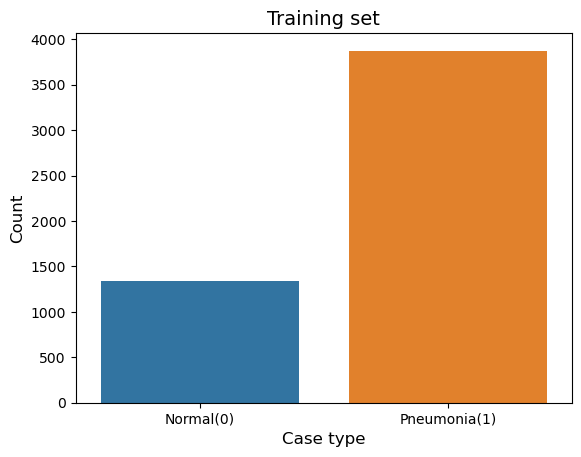

In [5]:
train_data = create_df(train_dir)
train_counts = train_data['label'].value_counts()
sns.barplot(x=train_counts.index, y= train_counts.values)
plt.title('Training set', fontsize=14)
plt.xlabel('Case type', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(range(len(train_counts.index)), ['Normal(0)', 'Pneumonia(1)'])
#plt.savefig("Original training data distribution")
plt.show()

## Plot new label distribution

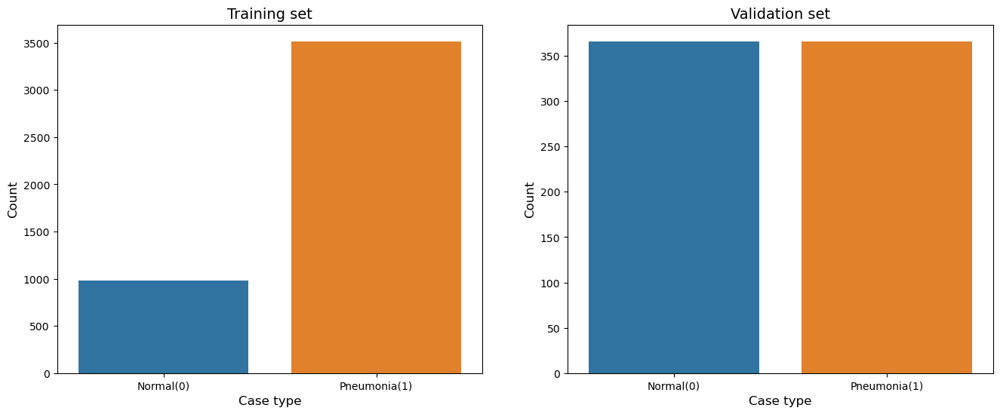

In [6]:
# Load the data into a pandas dataframe
train_data = create_df(train_dir)
val_data = create_df(val_dir)
test_data = create_df(test_dir)

# Combine the train and val data into a single dataframe
full_data = pd.concat([train_data, val_data], axis=0)

validation_size = int(len(full_data["label"])*0.07)
grouped = full_data.groupby("label")
val_data = grouped.apply(lambda x: x.sample(validation_size))
validation_indices = [ index[1] for index in val_data.index]
train_data = full_data.drop(validation_indices)

#randomize
# apply a random permutation to the groups using numpy's permutation function
labels = train_data['label'].tolist()
labels_rd = np.random.permutation(labels)
train_data_rd = train_data.copy(deep=True)
train_data_rd['label'] = labels_rd
train_data_rd = train_data_rd.reset_index(drop=True)

#We reset the index
train_data = train_data.reset_index(drop=True)
val_data = val_data.reset_index(drop=True)

# Split the data into train and validation sets
#train_data, val_data = train_test_split(full_data, test_size=0.2, stratify=balanced_target, random_state=42)

# Get the counts for each class in the train and validation sets
train_counts = train_data['label'].value_counts()
val_counts = val_data['label'].value_counts()

# Plot the results 
fig, axs = plt.subplots(ncols=2, figsize=(16, 6))

sns.barplot(x=train_counts.index, y= train_counts.values,ax=axs[0])
axs[0].set_title('Training set', fontsize=14)
axs[0].set_xlabel('Case type', fontsize=12)
axs[0].set_ylabel('Count', fontsize=12)
axs[0].set_xticks(range(len(train_counts.index)), ['Normal(0)', 'Pneumonia(1)'])


sns.barplot(x=val_counts.index, y= val_counts.values,ax=axs[1])
axs[1].set_title('Validation set', fontsize=14)
axs[1].set_xlabel('Case type', fontsize=12)
axs[1].set_ylabel('Count', fontsize=12)
axs[1].set_xticks(range(len(val_counts.index)), ['Normal(0)', 'Pneumonia(1)'])

#plt.savefig("Distribution of labels")
plt.show()


## Plot 5 examples of each classes

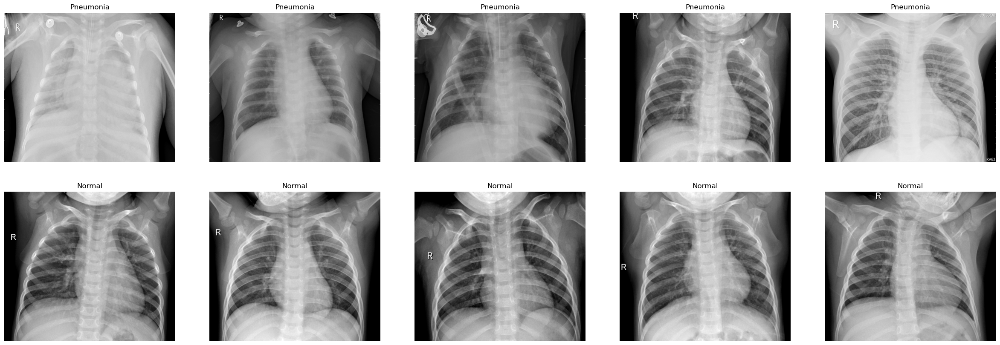

In [7]:
# Get few samples for both the classes
pneumonia_samples = (train_data[train_data['label']==1]['image'].iloc[:5]).tolist()
normal_samples = (train_data[train_data['label']==0]['image'].iloc[:5]).tolist()

# Concat the data in a single list and del the above two list
samples = pneumonia_samples + normal_samples

# Plot the data 
f, ax = plt.subplots(2,5, figsize=(30,10))
for i in range(10):
    img = imread(samples[i])
    ax[i//5, i%5].imshow(img, cmap='gray')
    if i<5:
        ax[i//5, i%5].set_title("Pneumonia")
    else:
        ax[i//5, i%5].set_title("Normal")
    ax[i//5, i%5].axis('off')
    ax[i//5, i%5].set_aspect('auto')
#plt.savefig("Examples of Pneumonia and Normal sampels")
plt.show()

# CNN

## Definition of the Dataset

In [8]:
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, df, transform=None,augmented=None):
        self.df = df
        self.transform = transform
        self.augmented=augmented
        
    def __getitem__(self, index):
        image_path = self.df.loc[index, 'image']
        label = self.df.loc[index, 'label']
        img = cv2.imread(image_path)
        if img.shape[2] == 1:
            img = np.dstack([img, img, img])
            
        img = cv2.resize(img,(224,224))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        if self.transform != None:
            img = self.transform(img)
        else:
            img = transforms.ToTensor()(img)
        if self.augmented != None:
            img = self.augmented(img)
            
        return img, label
    
    def __len__(self):
        return len(self.df)
    
class EqualizeHist(object):
    def __init__(self):
        pass
    def __call__(self,img):
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.merge([
            cv2.equalizeHist(img[:,:,0]),
            cv2.equalizeHist(img[:,:,1]),
            cv2.equalizeHist(img[:,:,2])
        ])
        img = img.astype(np.float32)/255
        img = transforms.ToTensor()(img)
        return img

## Definition of the CNN

In [9]:
import torch.nn as nn
import torchvision.models as models
import torch.optim as optim

class SimpleCNN(nn.Module):
    def __init__(self, pretrained=True):
        super(SimpleCNN, self).__init__()
        
        # First convolutional layer
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, stride=1, padding=1)
        self.relu1 = nn.ReLU(inplace=True)
        self.pool1 = nn.MaxPool2d(kernel_size=2)
        
        # Second convolutional layer
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1)
        self.relu2 = nn.ReLU(inplace=True)
        self.pool2 = nn.MaxPool2d(kernel_size=2)
        
        # Third convolutional layer
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1)
        self.relu3 = nn.ReLU(inplace=True)
        self.pool3 = nn.MaxPool2d(kernel_size=2)
        
        # First fully connected layer
        self.fc1 = nn.Linear(in_features=128*28*28, out_features=512)
        self.relu4 = nn.ReLU(inplace=True)
        self.dropout1 = nn.Dropout(0.2)
        
        # Second fully connected layer
        self.fc2 = nn.Linear(in_features=512, out_features=2)
        self.dropout2 = nn.Dropout(0.2)
        
        # Initialize weights with pretrained weights
        if pretrained:
            self.init_weights()
            
    def forward(self, x):
        x = self.pool1(self.relu1(self.conv1(x)))
        x = self.pool2(self.relu2(self.conv2(x)))
        x = self.pool3(self.relu3(self.conv3(x)))
        x = x.view(-1, 128*28*28)
        x = self.dropout1(self.relu4(self.fc1(x)))
        x = self.dropout2(self.fc2(x))
        return x
    
    def init_weights(self):
        # Load the pre-trained weights from the VGG16 model
        vgg16 = models.vgg16(pretrained=True)
        conv_layers = list(vgg16.features.children())
        
        self.conv1.weight.data = conv_layers[0].weight.data
        self.conv1.bias.data = conv_layers[0].bias.data
        self.conv2.weight.data = conv_layers[2].weight.data
        self.conv2.bias.data = conv_layers[2].bias.data
        self.conv3.weight.data = conv_layers[5].weight.data
        self.conv3.bias.data = conv_layers[5].bias.data

## Creation of balanced dataFrame and CNN

In [10]:
simple_CNN = SimpleCNN(pretrained=True)

#If cuda is available load the model on GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using the device : ",device)
simple_CNN = simple_CNN.to(device)

#Add a class weight to balance the dataset
class_weights = torch.FloatTensor([1, 1]).to(device)

# Define our loss function and optimizer
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.SGD(simple_CNN.parameters(), lr=0.001, momentum=0.9)

#Define the augmentation
augmentation = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(degrees=20)
])

#Define class weights
class_counts = train_data["label"].value_counts()
weights = [1/class_counts[0],1/class_counts[1]]
sample_weights = [weights[label] for label in train_data['label']]
num_samples = len(train_data["label"])

#Define sampler
sampler = torch.utils.data.WeightedRandomSampler(sample_weights,num_samples,replacement=True)

#Create training and validation dataset
train_dataset = CustomDataset(train_data,augmented=augmentation)
val_dataset = CustomDataset(val_data)
test_dataset = CustomDataset(test_data)

# Define our data loaders to efficiently load and pre-process our data
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64,sampler=sampler)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=64, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset,batch_size=64)

/opt/conda/lib/python3.7/site-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and may be removed in the future, "
/opt/conda/lib/python3.7/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Using the device :  cuda


## Train the model (or load the weights)

In [11]:
def train(model,randomize=False,path='../input/model-weights/simple_CNN.pt'):
    #If weights are already computed, load them in the model
    if os.path.exists(path) and not randomize:
        model.load_state_dict(torch.load(path,map_location=torch.device(device)))
        print("Weights loaded from ",path)
    elif randomize and os.path.exists(path):
        model.load_state_dict(torch.load(path,map_location=torch.device(device)))
        print("Weights loaded from ",path)
    else:
        loader = train_loader_rd if randomize else train_loader
        #Otherwise tain the model for 10 epochs
        for epoch in range(10):
            train_loss = 0.0
            for i, (inputs,label) in enumerate(loader, 0):
                # Get the inputs and labels for this batch
                inputs, labels = inputs.to(device), label.to(device)
                # Zero the parameter gradients
                optimizer.zero_grad()

                # Forward pass
                outputs = model(inputs)
                loss = criterion(outputs, labels)

                # Backward pass and optimize
                loss.backward()
                optimizer.step()

                # Print statistics
                train_loss += loss.item()
                if i % 10 == 9:    # Print every 10 batches
                    print('[%d, %5d] loss: %.3f' %
                          (epoch + 1, i + 1, train_loss / 10))
                    train_loss = 0.0

            # Evaluate the model on the validation set
            correct = 0
            total = 0
            val_loss = 0.0
            with torch.no_grad():
                for (inputs,label) in val_loader:
                    inputs, labels = inputs.to(device), label.to(device)
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    val_loss += loss.item()
                    _, predicted = torch.max(outputs.data, 1)
                    total += labels.size(0)
                    correct += (predicted == labels).sum().item()

            print('Validation loss: %.3f' % (val_loss / len(val_loader)))
            print('Validation accuracy: %.3f %%' % (100 * correct / total))
        print('Finished Training')
        # Save the weights
        torch.save(model.state_dict(), 'simple_CNN.pt')

In [12]:
train(simple_CNN)

Weights loaded from  ../input/model-weights/simple_CNN.pt


## Define an evaluation function for our model

In [13]:
def eval_model(model,test_loader):
    # Evaluate the model on the Testing set
    test_loss = 0.0
    all_outputs = []
    all_labels = []
    model.eval()
    with torch.no_grad():
        for (inputs,label) in test_loader:
            inputs, labels = inputs.to(device), label.to(device)
            outputs = simple_CNN(inputs)
            loss = criterion(outputs, labels)
            test_loss += loss.item()
            outputs = torch.nn.functional.softmax(outputs, dim=1)
            outputs = outputs.argmax(dim=1)
            all_outputs = np.concatenate((all_outputs,outputs.cpu().numpy()),axis=0)
            all_labels =  np.concatenate((all_labels,labels.cpu().numpy()),axis=0)
            
            
    accuracy = 100 * (all_labels==all_outputs).sum() / len(all_labels)
    f1 = f1_score(all_labels, all_outputs)
    print('Accuracy on validation set: {:.2f}%'.format(accuracy))
    print('F1 score on validation set: {:.4f}'.format(f1))
    
    # Calculate Precision and Recall     
    cm = confusion_matrix(all_labels,all_outputs)
    tn, fp, fn, tp = cm.ravel()

    precision = tp/(tp+fp)
    recall = tp/(tp+fn)

    print("Recall of the model is {:.2f}".format(recall))
    print("Precision of the model is {:.2f}".format(precision))
    # Convert the counts to percentages of the real values
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    # Set the labels for the x and y axes
    labels = ['Class 0', 'Class 1']

    # Display the confusion matrix with values and percentages
    plt.imshow(cm_norm, cmap=plt.cm.Blues)

    for i in range(cm_norm.shape[0]):
        for j in range(cm_norm.shape[1]):
            plt.text(j, i, "{:.2f}%\n({})".format(cm_norm[i, j]*100, cm[i, j]), ha="center", va="center", color="black")

    plt.colorbar()
    plt.xticks(np.arange(2), labels)
    plt.yticks(np.arange(2), labels)
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.title("Confusion Matrix")
    plt.savefig("Test results")
    plt.show()
    print('Testing loss: %.3f' % (test_loss / len(test_loader)))

## Evaluate the model on Validation and Test set

Accuracy on validation set: 97.27%
F1 score on validation set: 0.9726
Recall of the model is 0.97
Precision of the model is 0.98


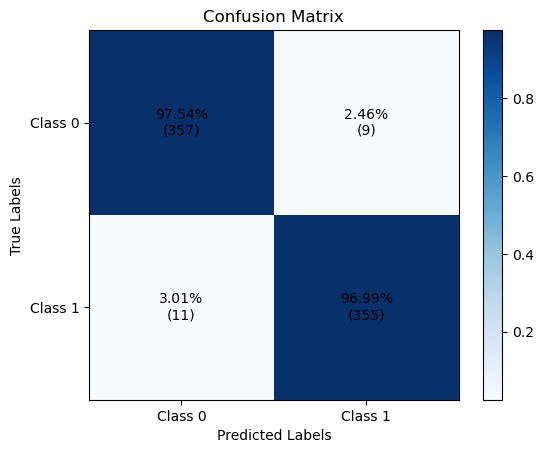

Testing loss: 0.077


In [14]:
eval_model(simple_CNN,val_loader)

Accuracy on validation set: 78.53%
F1 score on validation set: 0.8521
Recall of the model is 0.99
Precision of the model is 0.75


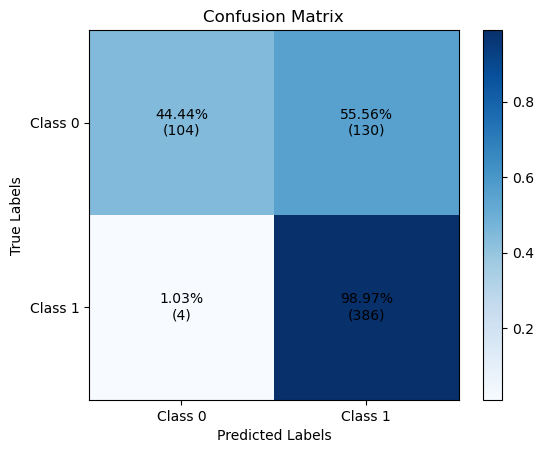

Testing loss: 0.614


In [15]:
eval_model(simple_CNN,test_loader)

## Create display dataLoader

In [16]:
# Get few samples for both the classes
pneumonia_samples = (train_data[train_data['label']==1].iloc[:5])
normal_samples = (train_data[train_data['label']==0].iloc[:5])

samples = pd.concat([pneumonia_samples,normal_samples])
samples = samples.reset_index(drop=True)

#Create display dataset
display_dataset = CustomDataset(samples)
display_dataloader = torch.utils.data.DataLoader(display_dataset,batch_size=1,shuffle=False)

## Integrated Gradients

In [17]:
def integrated_gradient(model,dataloader):
    #Plot the data
    f, ax = plt.subplots(4,5, figsize=(30,15))
    model.eval()
    ig = IntegratedGradients(model)
    for i,(img,label) in enumerate(dataloader):
        if i<5:
            ax[i//5, i%5].imshow(img.squeeze().transpose(2,0).transpose(0,1), cmap='gray')
            ax[i//5, i%5].set_title("Pneumonia")
            inputs = img.to(device)
            attr, delta = ig.attribute(inputs,target=1,return_convergence_delta=True)
            attr = attr.cpu().squeeze().transpose(2,0).transpose(0,1).numpy()
            attr = (attr - np.min(attr)) / (np.max(attr) - np.min(attr))
            ax[i//5+1, i%5].imshow(attr, cmap='gray')
        elif i < 10:
            ax[i//5+1, i%5].imshow(img.squeeze().transpose(2,0).transpose(0,1), cmap='gray')
            ax[i//5+1, i%5].set_title("Normal")
            inputs = img.to(device)
            attr, delta = ig.attribute(inputs,target=0,return_convergence_delta=True)
            attr = attr.cpu().squeeze().transpose(2,0).transpose(0,1).numpy()
            attr = (attr - np.min(attr)) / (np.max(attr) - np.min(attr))
            ax[i//5+2, i%5].imshow(attr, cmap='gray')
        ax[i//5, i%5].axis('off')
        ax[i//5, i%5].set_aspect('auto')
        ax[i//5+1, i%5].axis('off')
        ax[i//5+1, i%5].set_aspect('auto')
        ax[i//5+2, i%5].axis('off')
        ax[i//5+2, i%5].set_aspect('auto')
    plt.show()

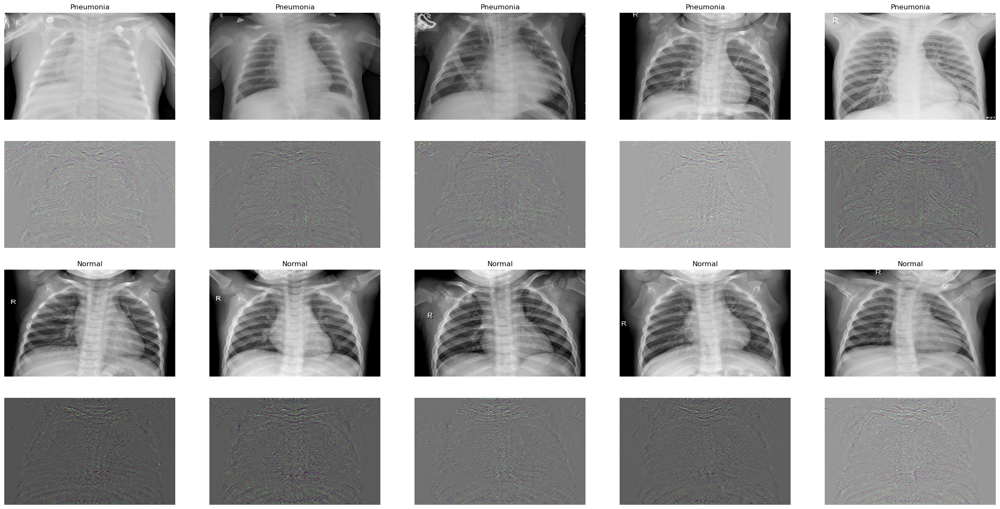

In [18]:
integrated_gradient(simple_CNN,display_dataloader)

## Grad-CAM

In [19]:
def gradCam(model,dataloader):
    #Plot the data
    f, ax = plt.subplots(4,5, figsize=(30,15))
    model.eval()
    guided_gc = GuidedGradCam(model, model.conv3)
    for i,(img,label) in enumerate(display_dataloader):
        if i<5:
            ax[i//5, i%5].imshow(img.squeeze().transpose(2,0).transpose(0,1), cmap='gray')
            ax[i//5, i%5].set_title("Pneumonia")
            inputs = img.to(device)
            attr = guided_gc.attribute(inputs, 1).detach().cpu().numpy()
            attr = attr.squeeze().transpose(1,2,0)
            attr = (attr - np.min(attr)) / (np.max(attr) - np.min(attr))
            ax[i//5+1, i%5].imshow(attr)
        elif i < 10:
            ax[i//5+1, i%5].imshow(img.squeeze().transpose(2,0).transpose(0,1), cmap='gray')
            ax[i//5+1, i%5].set_title("Normal")
            inputs = img.to(device)
            attr = guided_gc.attribute(inputs, 0).detach().cpu().numpy()
            attr = attr.squeeze().transpose(1,2,0)
            attr = (attr - np.min(attr)) / (np.max(attr) - np.min(attr))
            ax[i//5+2, i%5].imshow(attr)
        ax[i//5, i%5].axis('off')
        ax[i//5, i%5].set_aspect('auto')
        ax[i//5+1, i%5].axis('off')
        ax[i//5+1, i%5].set_aspect('auto')
        ax[i//5+2, i%5].axis('off')
        ax[i//5+2, i%5].set_aspect('auto')
    plt.show()

/opt/conda/lib/python3.7/site-packages/captum/_utils/gradient.py:59: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  "required_grads has been set automatically." % index
/opt/conda/lib/python3.7/site-packages/captum/attr/_core/guided_backprop_deconvnet.py:65: UserWarning: Setting backward hooks on ReLU activations.The hooks will be removed after the attribution is finished
  "Setting backward hooks on ReLU activations."


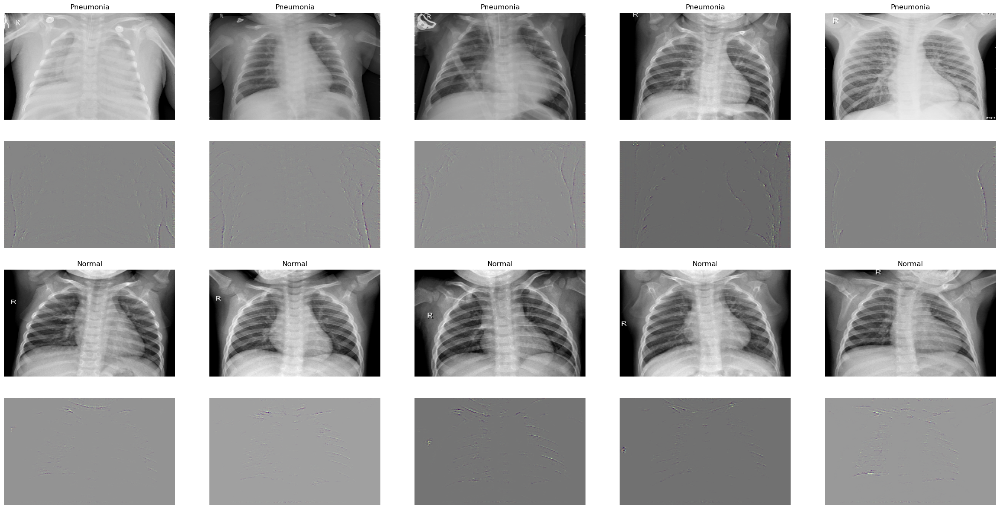

In [20]:
gradCam(simple_CNN,display_dataloader)

## Randomize Test

In [21]:
#randomize test
class_counts_rd = train_data_rd["label"].value_counts()
weights_rd = [1/class_counts_rd[0],1/class_counts_rd[1]]
sample_weights_rd = [weights_rd[label] for label in train_data_rd['label']]
num_samples_rd = len(train_data_rd["label"])

#Randomize sampler
sampler_rd = torch.utils.data.WeightedRandomSampler(sample_weights_rd,num_samples_rd,replacement=True)
#Training dataset randomize
train_dataset_rd = CustomDataset(train_data_rd,transform=None,augmented=augmentation)
#Randomize DataLoader
train_loader_rd = torch.utils.data.DataLoader(train_dataset_rd, batch_size=64,sampler=sampler_rd)

In [22]:
model_rd = SimpleCNN(True)
model_rd.to(device)
train(model_rd,randomize=True,path='../input/model-weights/simple_CNN_rd.pt')

/opt/conda/lib/python3.7/site-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and may be removed in the future, "
/opt/conda/lib/python3.7/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Weights loaded from  ../input/model-weights/simple_CNN_rd.pt


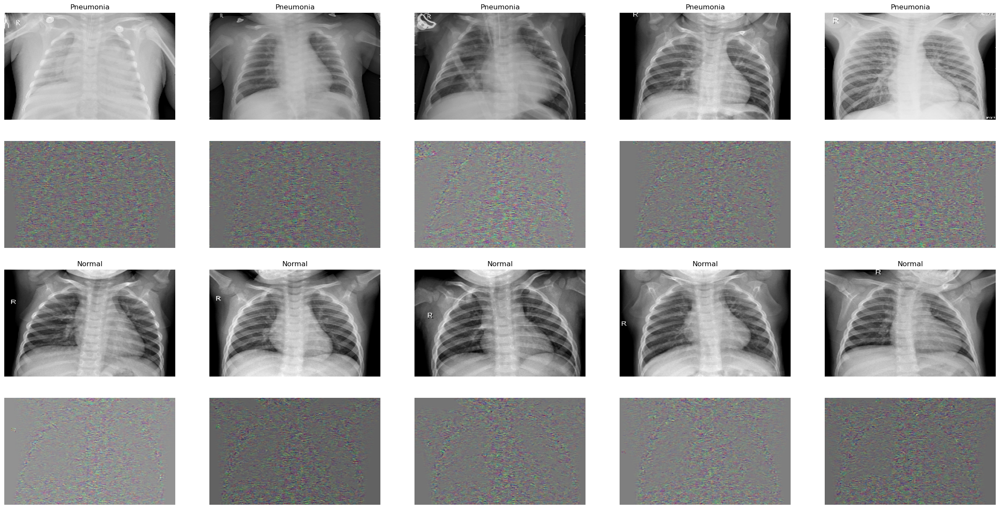

In [23]:
integrated_gradient(model_rd,display_dataloader)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in true_divide
  del sys.path[0]


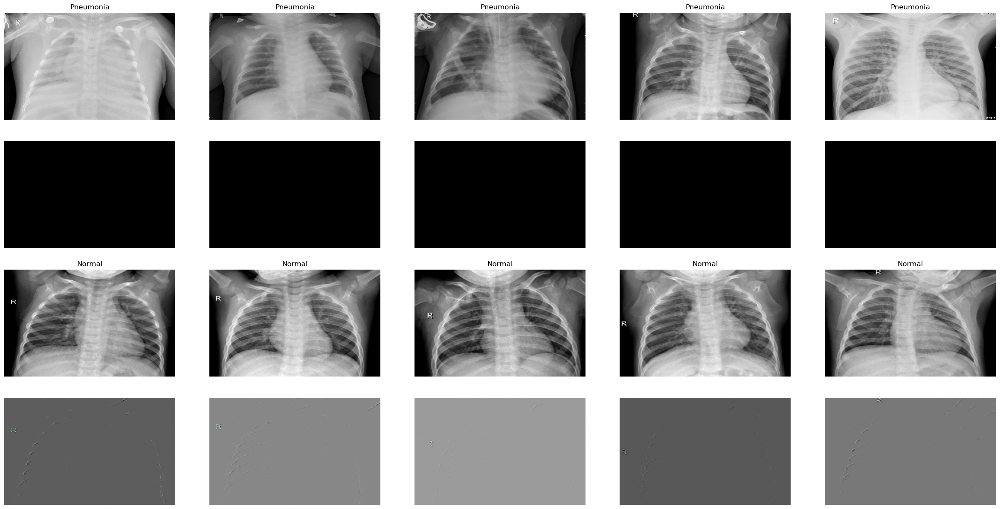

In [24]:
gradCam(model_rd,display_dataloader)